In [ ]:
import cv2 as cv
from google.colab import files
import numpy as np

In [ ]:
uploaded=files.upload()


Saving movingball.mp4 to movingball.mp4


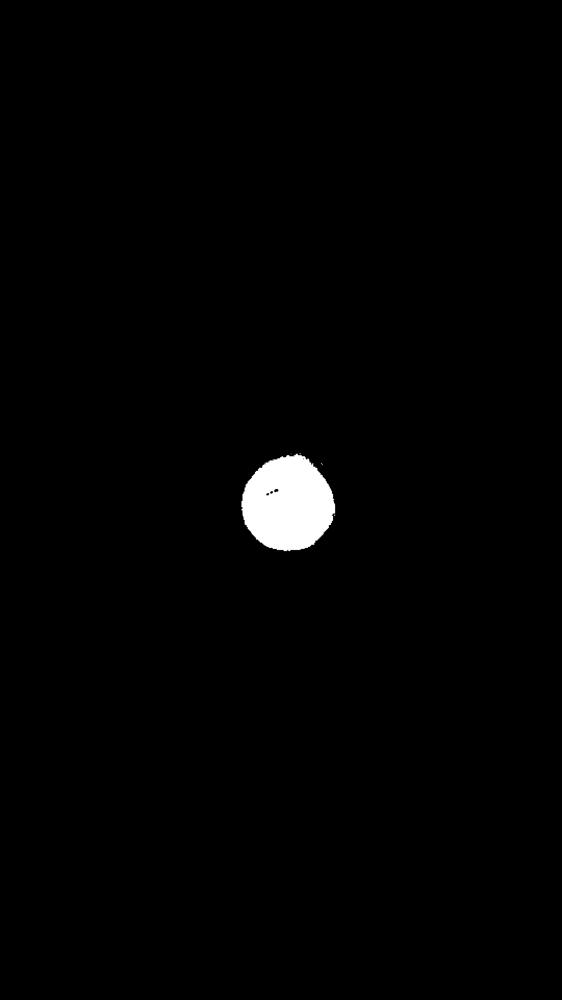

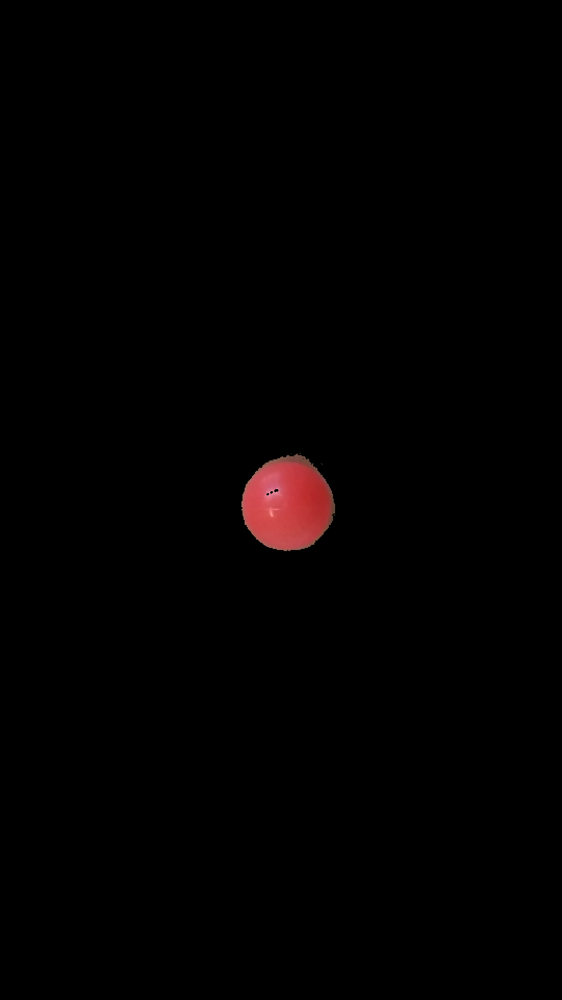

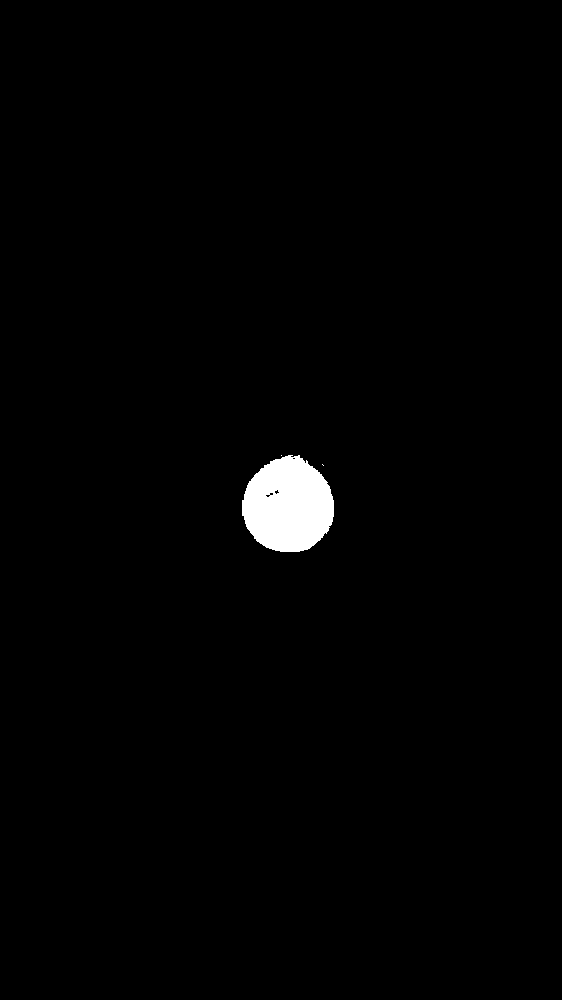

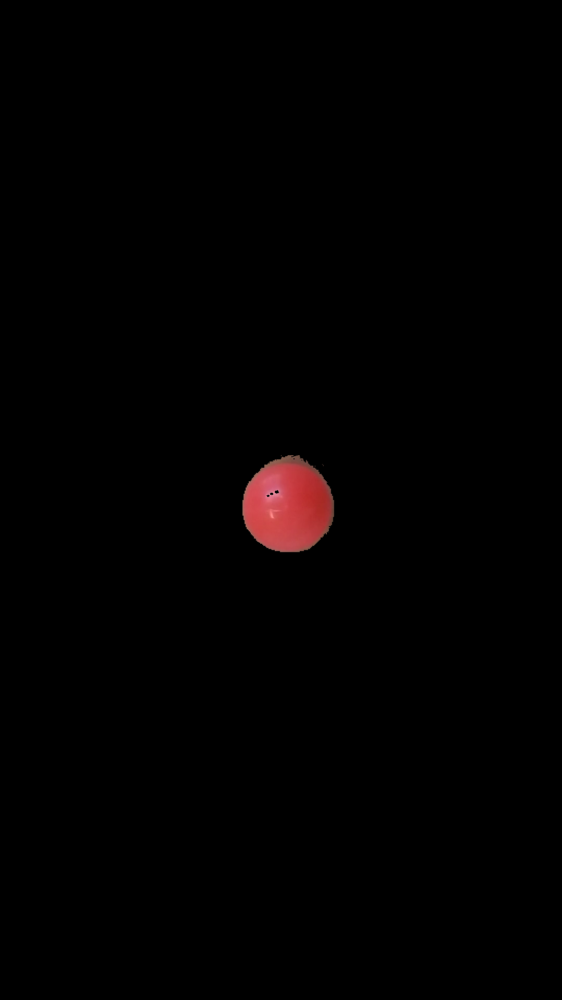

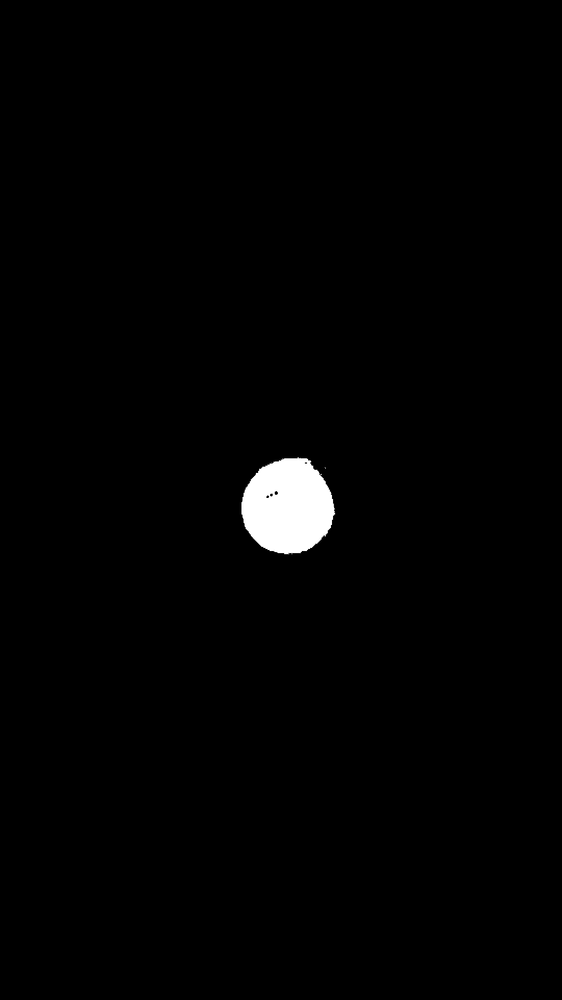

...

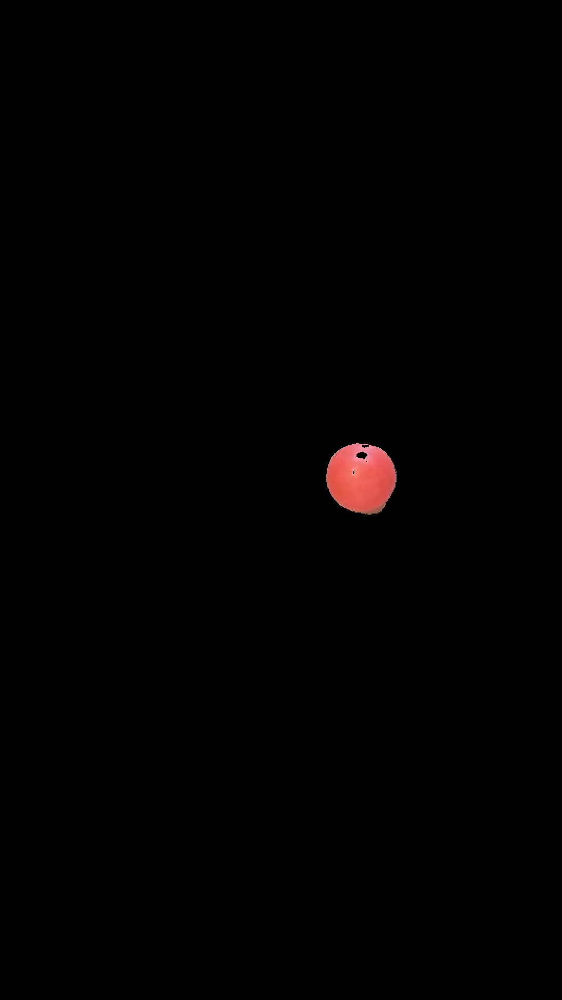

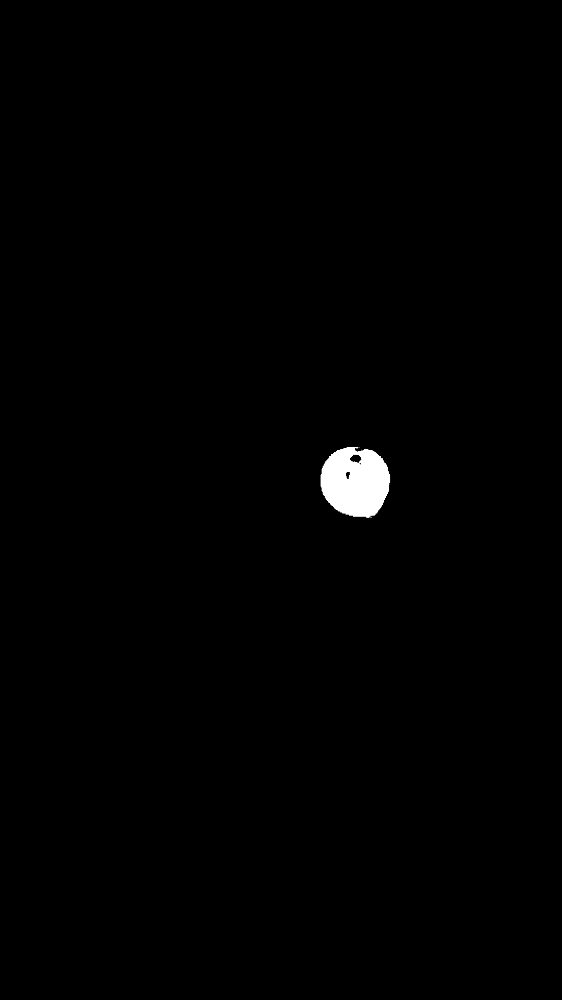

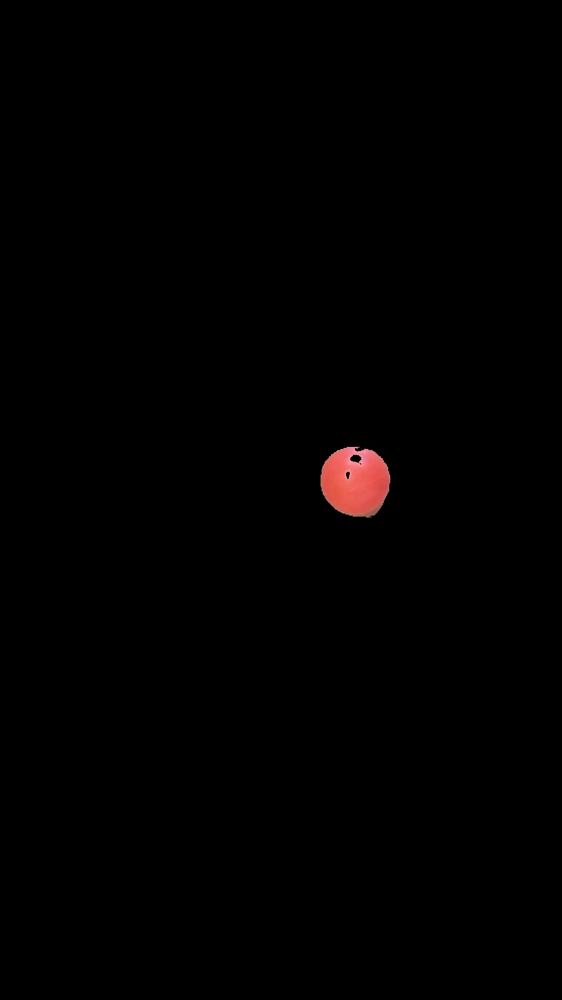

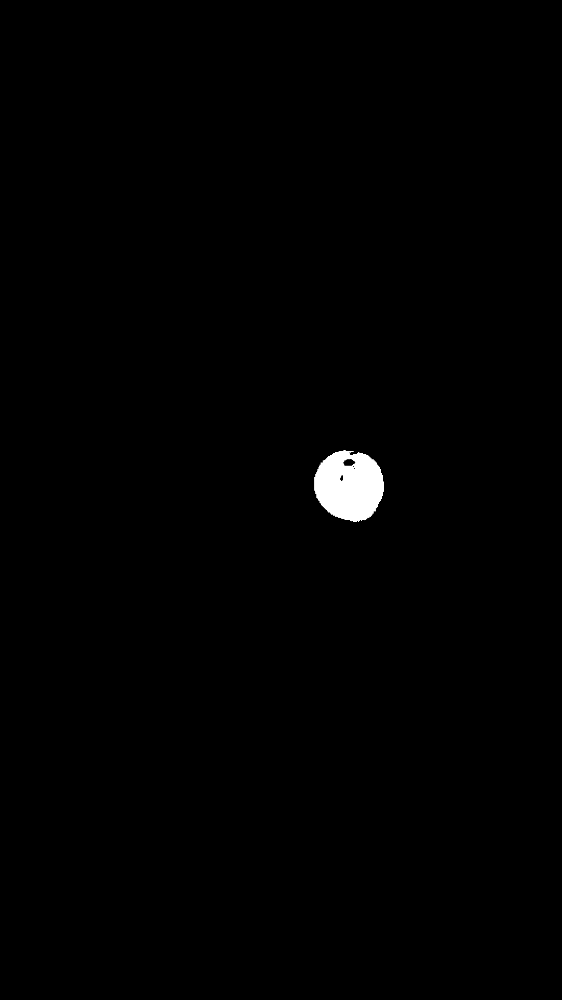

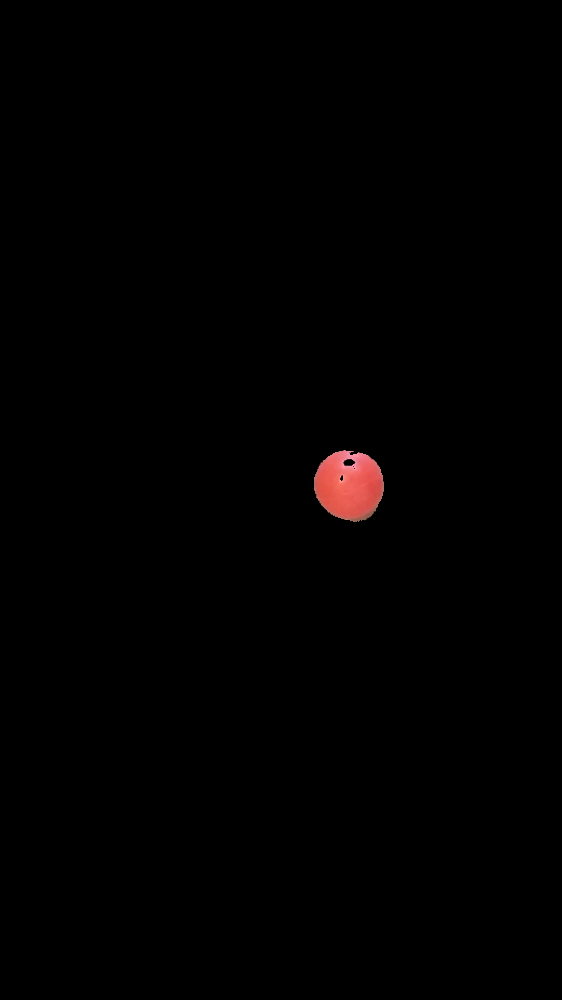

KeyboardInterrupt: ignored

In [ ]:
import cv2 as cv
import numpy as np

cap = cv.VideoCapture("./movingball.mp4")
new_size = (640, 480)
kernel = np.ones((4, 4), np.uint8)
if not cap.isOpened():
    print("Couldnt open file")
    exit()

while cap.isOpened:
    ret, frame = cap.read()
    # Check if video is finished
    if not ret:
        print("Video has finished")
        break
    # Changing the size of each frame
    frame = cv.resize(frame, new_size)

    # Changing the color coding to HSV
    hsv = cv.cvtColor(frame, cv.COLOR_BGR2HSV)

    # range for RED
    lower_color_ball = np.array([0, 100, 20])
    upper_color_ball = np.array([10, 255, 255])

    # Another range for red
    lower_color_ball1 = np.array([160, 100, 20])
    upper_color_ball1 = np.array([179, 255, 255])

    # Define a masks
    lower_mask = cv.inRange(hsv, lower_color_ball, upper_color_ball)
    upper_mask = cv.inRange(hsv, lower_color_ball1, upper_color_ball1)

    # Define a full mask for red color
    mask = lower_mask + upper_mask

    opening = cv.morphologyEx(mask, cv.MORPH_OPEN, kernel)
    closing = cv.morphologyEx(opening, cv.MORPH_CLOSE, kernel)

    full_mask = closing
    # cnt- contours , h- hierarchy
    cnt, h = cv.findContours(full_mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

    for i in range(len(cnt)):

        x, y, w, h = cv.boundingRect(cnt[i])
        M = cv.moments(cnt[i])

        # m10 first order moment of X / m00 last order moment of X
        cx = int(M['m10'] / M['m00'])
        # m01 first order moment of Y / m00 last order moment of Y
        cy = int(M['m01'] / M['m00'])
        # Draw center of gravity
        cv.circle(frame, (cx, cy), 3, (0, 255, 0), -1)

        # Draw rectangle with specific coordinates and specific color according to BGR and
        cv.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 1)
        cv.imshow('Frame', frame)

    if cv.waitKey(1) == ord('q'):
        break
cv.destroyAllWindows()
